<a href="https://colab.research.google.com/github/tGhattas/IMP-styleGAN/blob/main/AdaptedStyleGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Setup


In [ ]:

from google.colab import drive
drive.mount('/content/drive', force_remount=True)

import os
main_folder = "/content/drive/My Drive/Colab Notebooks/"
os.chdir(main_folder)

try:
    os.chdir("style-image-prior")
except:
    print("warning: git folder was not loaded")
    !git clone https://github.com/avivga/style-image-prior
    os.chdir("style-image-prior")
!pwd

Mounted at /content/drive
/content/drive/My Drive/Colab Notebooks/style-image-prior


In [ ]:
!pip install https://github.com/podgorskiy/dnnlib/releases/download/0.0.1/dnnlib-0.0.1-py3-none-any.whl

%tensorflow_version 1.x
import tensorflow as tf
print(tf.__version__)

TensorFlow 1.x selected.
1.15.2


#Model Hyper Params and Configuration

In [ ]:
class ModelConfig(object):
    def __init__(self):
        self.imgs_dir = "./data" 
        self.reconstructions_dir = "./out/reconstructions" 
        self.latents_dir = "./out/latents" 
        self.optimizer = 'adam'
        self.input_img_size = (1024, 1024)
        self.perceptual_img_size =(256, 256)
        self.learning_rate = 1e-3
        self.total_iterations = 1000

class ConfigDeblur(ModelConfig):
    def __init__(self):
        super().__init__()
        self.name = "deblur"
        
class ConfigColorize(ModelConfig):
    def __init__(self):
        super().__init__()
        self.name = "color"
        self.total_iterations = 10000

class ConfigDenoised(ModelConfig):
    def __init__(self):
        super().__init__()
        self.name = "denoise"
        self.mean = 0
        self.var = 50
        self.sigma = self.var ** 0.5
        self.noise_factor = 0.35

config_deblur = ConfigDeblur()
config_color = ConfigColorize()
config_denoise = ConfigDenoised()

#Data Preparation


In [ ]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
from   scipy.ndimage.filters import gaussian_filter

%matplotlib inline

def load_image(img_path, *args, **kwargs):
    return cv2.imread(img_path, *args, **kwargs)
    
def write_image(img_path, im, *args, **kwargs):
    os.makedirs(os.path.dirname(img_path), exist_ok=True)
    cv2.imwrite(img_path, im, *args, **kwargs)

def show_img(img):
    from google.colab.patches import cv2_imshow
    cv2_imshow(img)

def sample_display(origs, reconsts=None, row_len=4, title_1=None, title_2=None, cmap_1=None, cmap_2=None):
    plt.figure(figsize=(24, 12))
    for i in range(1, row_len + 1):
        # Display original
        ax = plt.subplot(2, row_len, i)
        plt.imshow(np.squeeze(origs[i-1]), cmap_1)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
        if title_1:
          ax.set_title(title_1)
        if reconsts:
          # Display reconstruction
          ax = plt.subplot(2, row_len, i + row_len)
          plt.imshow(np.squeeze(reconsts[i-1]), cmap_2)
          ax.get_xaxis().set_visible(False)
          ax.get_yaxis().set_visible(False)
          if title_2:
            ax.set_title(title_2)
    plt.show()

def expand_kernel(k):
    k = np.expand_dims(k, (2,3))
    return np.repeat(k, 3, axis=2)

for i, img_name in enumerate(sorted(os.listdir("data"))):
    path = os.path.join("data", img_name)
    img = load_image(path)
    size = ModelConfig().input_img_size
    img = cv2.resize(img, size)
    os.remove(path)
    write_image(os.path.join("data", f"{i}_{size[0]}_{size[1]}.jpeg"), img)


Note that the photos used are brought from drive: https://drive.google.com/drive/folders/1tZUcXDBeOibC6jcMCtgRRz67pzrAHeHL

StyleGAN Nvidia Git: https://github.com/NVlabs/stylegan

#StyleGAN adaptation

In [ ]:
import pickle
import os
import imageio
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import dnnlib
import dnnlib.tflib as tflib
from tqdm.auto import tqdm
from perceptual_model import PerceptualModel

# original link: https://drive.google.com/uc?id=1MEGjdvVpUsu1jB4zrXZN7Y4kBBOzizDQ
STYLEGAN_MODEL_URL = 'https://drive.google.com/uc?id=1HQ8mBQ-sPuxnZeLUKseNhyAYHc33KoQU'

def plot_loss(points):
    plt.plot(points)
    plt.show()
    
def load_remote_model(with_disc=False):
    with dnnlib.util.open_url(STYLEGAN_MODEL_URL) as f:
        _, Ds, Gs = pickle.load(f)
    return Gs if not with_disc else (Gs, Ds)

def prepare_variables(config, Gs):
    with tf.variable_scope("prepare_variables", reuse=tf.AUTO_REUSE):
        latent_code = tf.get_variable(
            name=f'latent_code_{config.name}', shape=(1, 18, 512), dtype='float32',
            initializer=tf.initializers.zeros()
        )

    generated_img = Gs.components.synthesis.get_output_for(latent_code, randomize_noise=True)
    generated_img = tf.transpose(generated_img, [0, 2, 3, 1])
    generated_img = ((generated_img + 1) / 2) * 255
    generated_img_for_display = tf.saturate_cast(generated_img, tf.uint8)

    target_img = tf.placeholder(tf.float32, [None, config.input_img_size[0], config.input_img_size[1], 3])
    return latent_code, generated_img, generated_img_for_display, target_img
    

def get_convolved_images(images, kernel, conv_method):
    sess = tf.get_default_session()
    convolved = list()
    for im in images:
        im = np.expand_dims(im, 0)
        im_tf = tf.Variable(im, dtype=tf.float32, trainable=False)
        convolved_im, kernel = conv_method(im_tf, kernel)
        sess.run(tf.variables_initializer([im_tf, kernel]))
        convolved_im = sess.run(convolved_im)
        convolved.append(convolved_im[0].astype(np.uint8))
    return convolved

def depthwise_conv2d(x, k):
    a = tf.Variable(k, dtype=tf.float32, trainable=False)
    convolved_im = tf.nn.depthwise_conv2d(x, a, [1, 1, 1, 1], padding='SAME')
    return convolved_im, a

def conv2d(x, k):
    a = tf.Variable(k, dtype=tf.float32, trainable=False)
    convolved_im = tf.nn.conv2d(x, a, [1, 1, 1, 1], padding='SAME')
    return convolved_im, a

def train_and_predict(config, generated_img_for_display, latent_code, loss_op, optimizer, target_img, k, resume=False):
    train_op = optimizer.minimize(loss_op, var_list=[latent_code])
    sess = tf.get_default_session()
    img_names = sorted(os.listdir(config.imgs_dir))
    all_losses = list()
    images_res = list()
    for img_name in img_names:
        losses = list()
        img = imageio.imread(os.path.join(config.imgs_dir, img_name))
        if not resume:
            sess.run(tf.variables_initializer([latent_code, k] + optimizer.variables()))
        else:
            sess.run(tf.variables_initializer([k] + optimizer.variables()))

        progress_bar_iterator = tqdm(
            iterable=range(config.total_iterations),
            bar_format='{desc}: {percentage:3.0f}% |{bar}| {n_fmt}/{total_fmt}{postfix}',
            desc=img_name
        )

        for i in progress_bar_iterator:
            loss, _ = sess.run(
                fetches=[loss_op, train_op],
                feed_dict={
                    target_img: img[np.newaxis, ...]
                }
            )

            losses.append(loss)
            progress_bar_iterator.set_postfix_str('loss=%.2f' % loss)

        reconstructed_imgs, latent_codes = sess.run(
            fetches=[generated_img_for_display, latent_code],
            feed_dict={
                target_img: img[np.newaxis, ...]
            }
        )
        all_losses.append(losses)
        os.makedirs(config.reconstructions_dir, exist_ok=True)
        os.makedirs(config.latents_dir, exist_ok=True)
        imageio.imwrite(os.path.join(config.reconstructions_dir, img_name), reconstructed_imgs[0])
        np.savez(file=os.path.join(config.latents_dir, img_name + '.npz'), latent_code=latent_codes[0])
        images_res.append(reconstructed_imgs[0])

    return images_res, np.array(all_losses)

def get_optimzer(config):
    if config.optimizer == 'adam':
        optimizer = tf.train.AdamOptimizer(learning_rate=config.learning_rate)
    else:
        optimizer = tf.train.GradientDescentOptimizer(learning_rate=config.learning_rate)
    return optimizer

Using TensorFlow backend.


#Deblur

Defining debluring loss function


In [ ]:
def get_loss_op_deblur(config, target_img, generated_img, k, conv_method):
    convolved_generated_img, a = conv_method(generated_img, k)

    target_img_resized = tf.image.resize_images(
        target_img, tuple(config.perceptual_img_size), method=tf.image.ResizeMethod.NEAREST_NEIGHBOR
    )
    print(target_img_resized.shape)
    generated_img_resized = tf.image.resize_images(
        convolved_generated_img, tuple(config.perceptual_img_size), method=tf.image.ResizeMethod.NEAREST_NEIGHBOR
    )

    perceptual_model = PerceptualModel(img_size=config.perceptual_img_size)
    generated_img_features = perceptual_model(generated_img_resized)
    target_img_features = perceptual_model(target_img_resized)

    loss_op = tf.reduce_mean(tf.abs(generated_img_features - target_img_features))
    return loss_op, a


Define and visualize blurring kernels

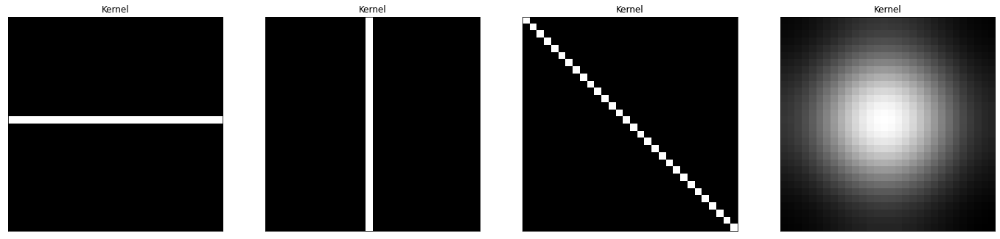

In [ ]:

filters_shape = (30, 30)

# Kernel 1
k1 = np.zeros(filters_shape)
k1[((k1.shape[0]-1)//2)] = 1
k1 /= k1.sum()
# Kernel 2
k2 = k1.T
# Kernel 3
k3 = np.eye(filters_shape[0])
k3 /= k3.sum()
# Kernel 4
k4 = np.zeros((30, 30))
k4[14, 14] = 1
k4 = gaussian_filter(k4, sigma=7)


kernels = [k1, k2, k3, k4]
for i, k in enumerate(kernels):
    kernels[i] = expand_kernel(k)

# visualize kernels
sample_display([k1, k2, k3, k4], row_len=len(kernels), cmap_1='gray', title_1='Kernel')


Run training and prediction

In [ ]:
tflib.init_tf()
# load remote Generator Synthesizer used in StyleGAN
Gs = load_remote_model() 

In [ ]:
tup = prepare_variables(config_deblur, Gs)
latent_code, generated_img, generated_img_for_display, target_img = tup

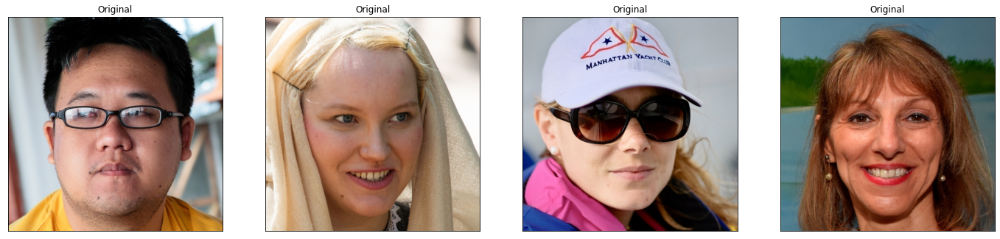

(?, 256, 256, 3)
Instructions for updating:
If using Keras pass *_constraint arguments to layers.



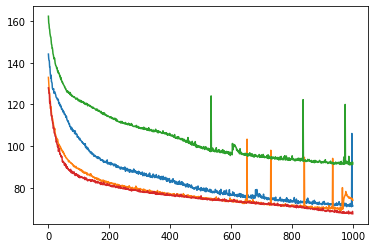

Instructions for updating:
Use Variable.read_value. Variables in 2.X are initialized automatically both in eager and graph (inside tf.defun) contexts.


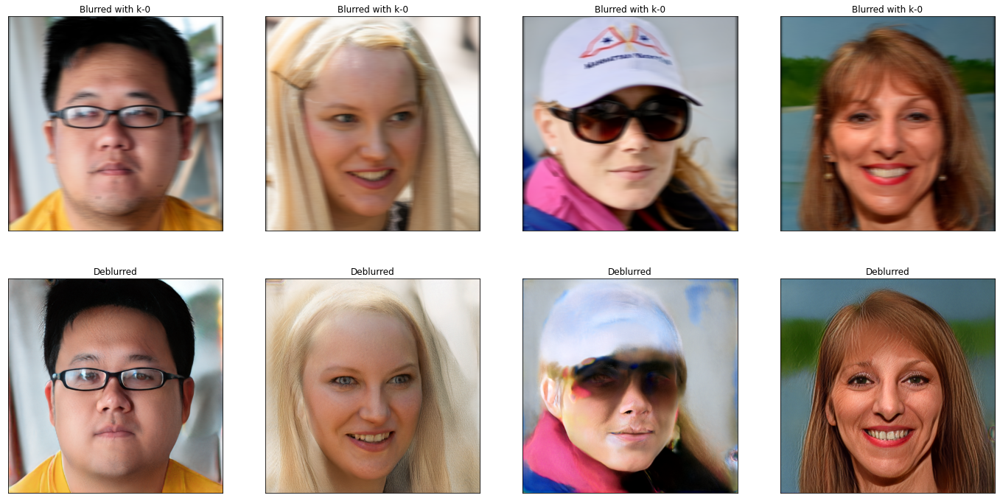

(?, 256, 256, 3)


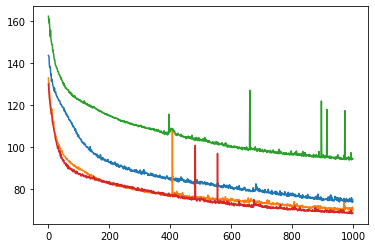

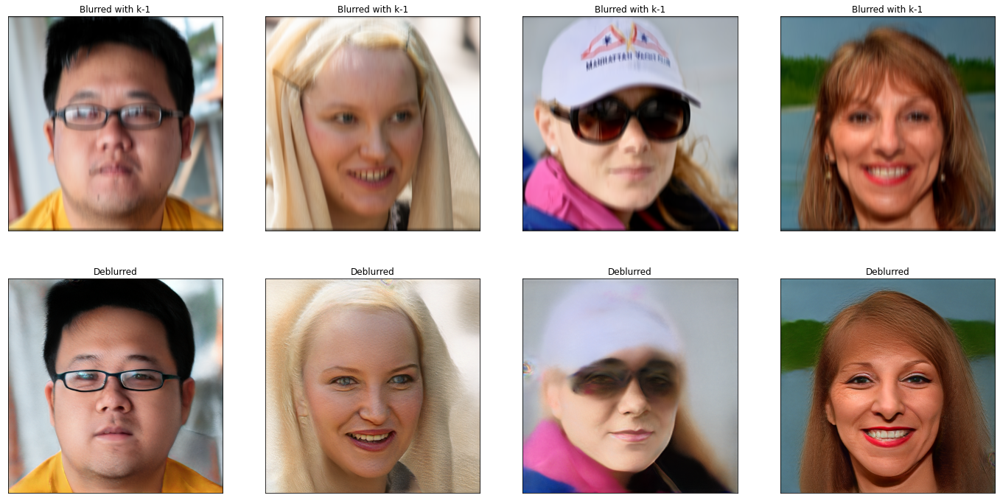

(?, 256, 256, 3)


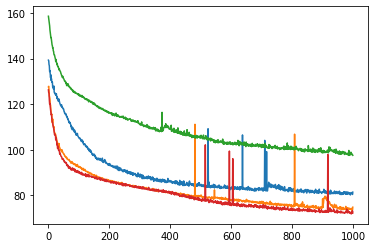

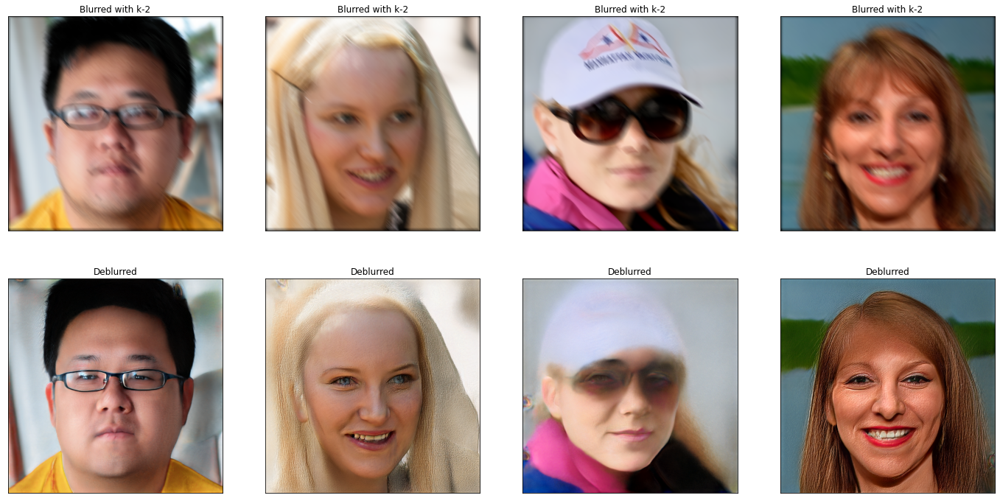

(?, 256, 256, 3)


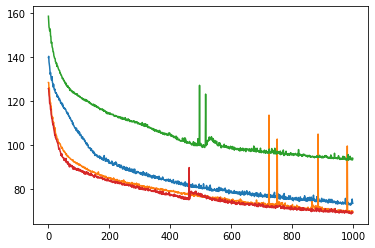

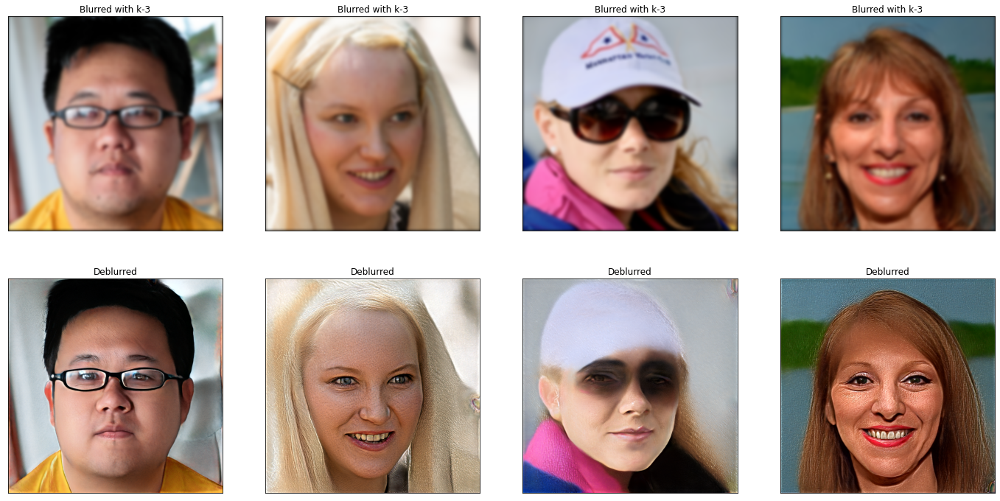

In [ ]:
original_images = list()

for im_path in sorted(os.listdir(config_deblur.imgs_dir)):
    img = load_image(os.path.join(config_deblur.imgs_dir, im_path))
    img = cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_BGR2RGB)
    original_images.append(img)

sample_display(original_images, title_1="Original")

for i, k in enumerate(kernels):
    loss_op, k = get_loss_op_deblur(config_deblur, target_img, generated_img, k,
                             depthwise_conv2d)
    optimizer = get_optimzer(config_deblur)

    images_res, losses = train_and_predict(config_deblur, generated_img_for_display,
                               latent_code, loss_op, optimizer, target_img,
                               k, resume=False)
    img = cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_BGR2RGB)
    plot_loss(losses.T)
    sample_display(get_convolved_images(original_images, k, depthwise_conv2d),
               images_res, title_1=f"Blurred with k-{i}", title_2="Deblurred")



#Colorization

Defining colorization loss function


In [ ]:
def get_loss_op_color(config, target_img, generated_img, k, conv_method, use_percep=False):
    convolved_generated_img, a = conv_method(generated_img, k)
    loss_op = tf.reduce_mean(tf.abs(convolved_generated_img - target_img))
    if use_percep:
        convolved_generated_img_ = tf.nn.depthwise_conv2d(generated_img, a, [1, 1, 1, 1], padding='SAME')
        target_img_resized = tf.image.resize_images(
            target_img, tuple(config.perceptual_img_size), method=tf.image.ResizeMethod.NEAREST_NEIGHBOR
        )
        generated_img_resized = tf.image.resize_images(
            convolved_generated_img_, tuple(config.perceptual_img_size), method=tf.image.ResizeMethod.NEAREST_NEIGHBOR
        )
        perceptual_model = PerceptualModel(img_size=config.perceptual_img_size)
        generated_img_features = perceptual_model(generated_img_resized)
        target_img_features = perceptual_model(target_img_resized)
        loss_op_2 = tf.reduce_mean(tf.abs(generated_img_features - target_img_features))
        
        return loss_op*0.8+loss_op_2*0.2, a
    return loss_op, a

Run training and prediction

In [ ]:
tflib.init_tf()
# load remote Generator Synthesizer used in StyleGAN
Gs, D = load_remote_model(True)

In [ ]:
tup = prepare_variables(config_color, Gs)
latent_code, generated_img, generated_img_for_display, target_img = tup

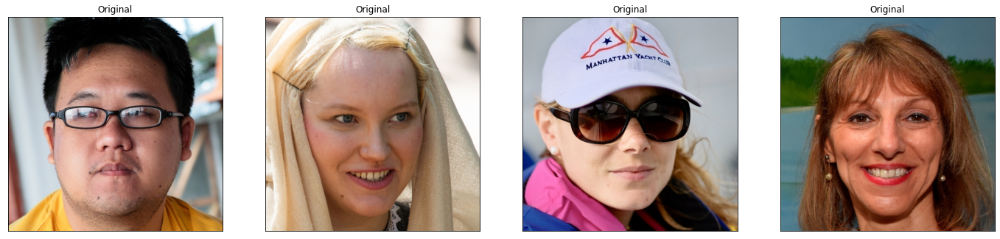

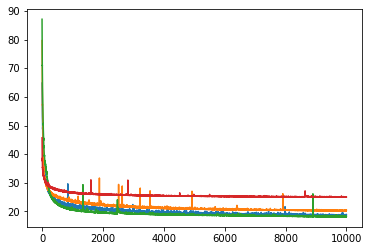

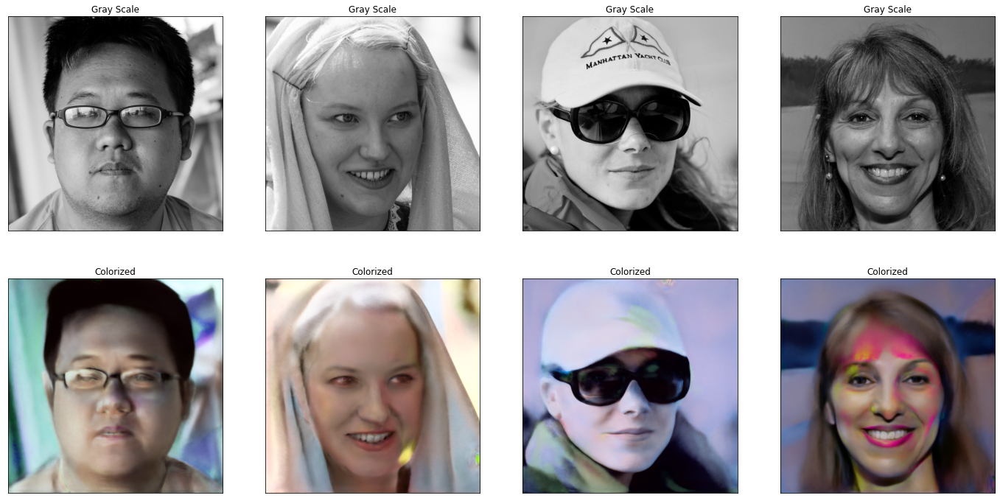

In [ ]:
R, G, B = 0.2126, 0.7152, 0.0722
rgb_filter = [B, G, R]
rgb_filter = np.array(rgb_filter).reshape((1,1,3,1))
original_images = list()

for im_path in sorted(os.listdir(config_color.imgs_dir)):
    img = load_image(os.path.join(config_color.imgs_dir, im_path))
    img = cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_BGR2RGB)
    original_images.append(img)

sample_display(original_images, title_1="Original")

loss_op, k = get_loss_op_color(config_color, target_img, generated_img,
                               rgb_filter, conv2d)
optimizer = get_optimzer(config_color)
images_res, losses = train_and_predict(config_color, generated_img_for_display, latent_code,
                           loss_op, optimizer, target_img, k, resume=False)
img = cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_BGR2RGB)

plot_loss(losses.T)

sample_display(get_convolved_images(original_images, rgb_filter, conv2d),
               images_res, cmap_1="gray", title_1="Gray Scale",
               title_2="Colorized")

# Gaussian Image Denoising (not complete)


Define noise adding auxilary functions

In [ ]:
def add_noise_to_tensor(config, img):
    img = tf.saturate_cast(img, tf.float32)
    img /= 255.0
    gaussian_ = config.noise_factor * tf.random.normal(img.shape.as_list()[:-1], config.mean,
                                config.sigma, dtype=tf.float32)
    
    gaussian = tf.stack([gaussian_, gaussian_, gaussian_], axis=-1)
    gaussian /= tf.reduce_max(gaussian)
    gaussian += tf.reduce_min(gaussian) 
    img += gaussian
    img *= 255.0
    return img # float32

def add_noise_to_nparray(config, img):
    img = img.astype(np.float32) 
    img /= 255.0
    gaussian_ = config.noise_factor * np.random.normal(config.mean, config.sigma, img.shape[:-1])
    gaussian =  np.stack([gaussian_, gaussian_, gaussian_], axis=-1)
    gaussian /= gaussian.max()
    gaussian += np.abs(gaussian.min())
    noised_img = gaussian + img
    noised_img *= 255.0
    noised_img = noised_img.astype(np.uint8)
    return noised_img # uint8

Defining denoising loss function


In [ ]:
def get_loss_gauss_denoise_1(config, target_img, generated_img, k, conv_method):
    convolved_generated_img, a = conv_method(generated_img, k)

    # convolved_generated_img = add_noise_to_tensor(config, convolved_generated_img)

    target_img_resized = tf.image.resize_images(
        target_img, tuple(config.perceptual_img_size), method=tf.image.ResizeMethod.NEAREST_NEIGHBOR
    )

    generated_img_resized = tf.image.resize_images(
        convolved_generated_img, tuple(config.perceptual_img_size), method=tf.image.ResizeMethod.NEAREST_NEIGHBOR
    )

    perceptual_model = PerceptualModel(img_size=config.perceptual_img_size)
    generated_img_features = perceptual_model(generated_img_resized)
    target_img_features = perceptual_model(target_img_resized)

    loss_op = tf.reduce_mean(tf.abs(generated_img_features - target_img_features))
    return loss_op, a

def get_loss_gauss_denoise_2(config, target_img, generated_img, k, conv_method):
    convolved_generated_img, a = conv_method(generated_img, k)

    convolved_generated_img = add_noise_to_tensor(config, convolved_generated_img)

    loss_op = tf.reduce_mean(tf.abs(convolved_generated_img - target_img))
    return loss_op, a

Run training and prediction

In [ ]:
tflib.init_tf()
# load remote Generator Synthesizer used in StyleGAN
Gs = load_remote_model()

In [ ]:
tup = prepare_variables(config_denoise, Gs)
latent_code, generated_img, generated_img_for_display, target_img = tup

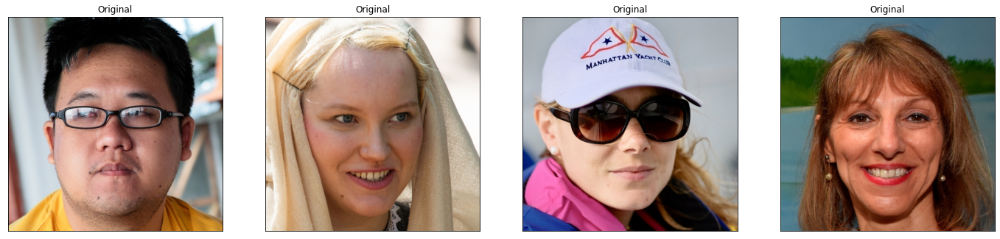

Training with loss fucntion get_loss_gauss_denoise_1


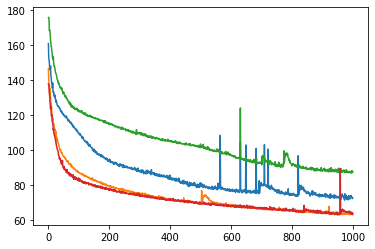

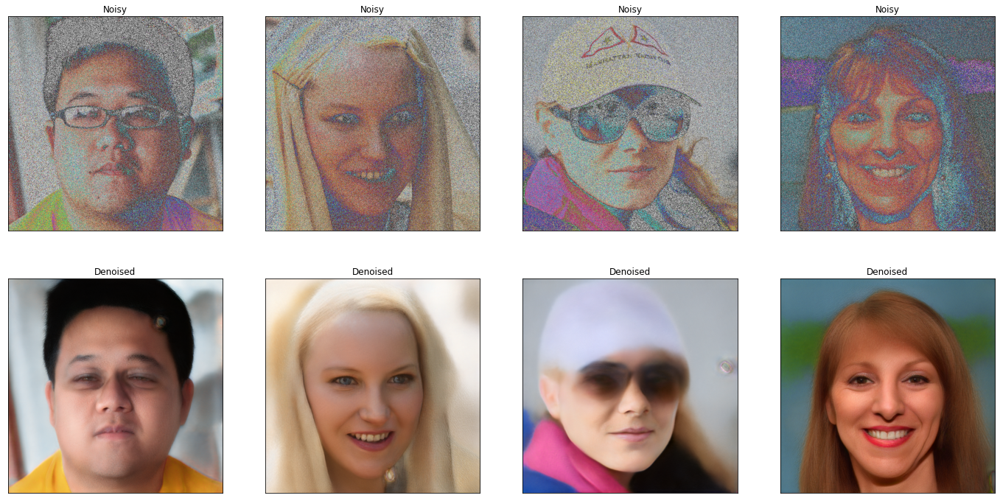

In [ ]:
identity_filter = np.zeros((3,3))
identity_filter[1, 1] = 1
identity_filter = expand_kernel(identity_filter)
original_images = list()

for im_path in sorted(os.listdir(config_denoise.imgs_dir)):
    img = load_image(os.path.join(config_denoise.imgs_dir, im_path))
    img = cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_BGR2RGB)
    original_images.append(img)

sample_display(original_images, title_1="Original")

loss_function = get_loss_gauss_denoise_1

print(f"Training with loss fucntion {loss_function.__name__}")
loss_op, k = loss_function(config_denoise, target_img, generated_img,
                          identity_filter, depthwise_conv2d)
optimizer = get_optimzer(config_denoise)

images_res, losses = train_and_predict(config_denoise, generated_img_for_display,
                            latent_code, loss_op, optimizer, target_img,
                            k, resume=False)
img = cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_BGR2RGB)
plot_loss(losses.T)

original_images = np.array(original_images)
noised_originals = add_noise_to_nparray(config_denoise, original_images)
sample_display(noised_originals, images_res, title_1="Noisy",
                title_2="Denoised")



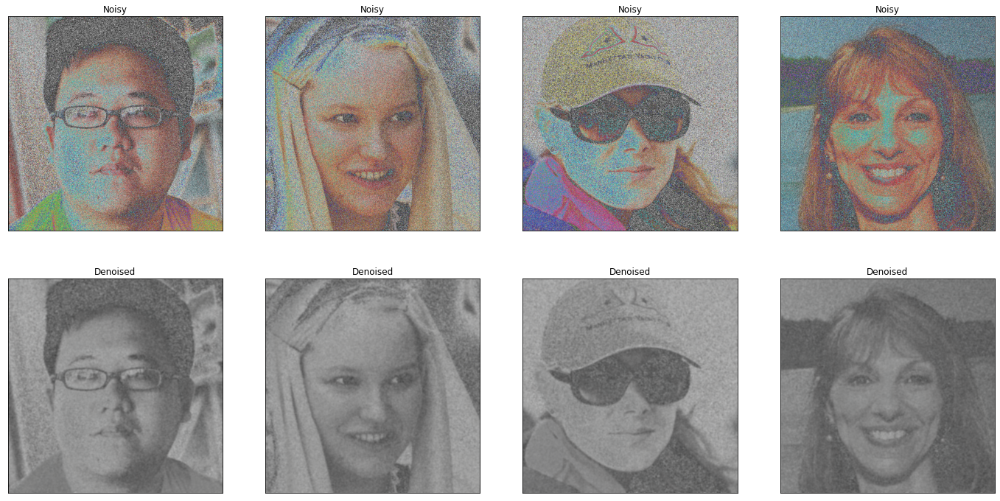

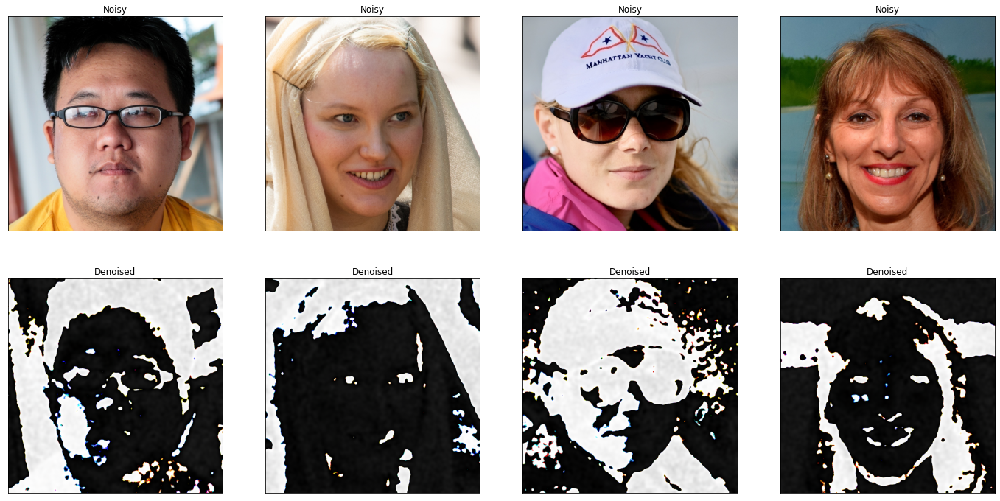

In [ ]:


original_images=[]
for im_path in sorted(os.listdir(config_denoise.imgs_dir)):
    img = load_image(os.path.join(config_denoise.imgs_dir, im_path))
    img = cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_BGR2RGB)
    original_images.append(img)

original_images = np.array(original_images)
noised_originals = add_noise_to_nparray(config_denoise, original_images)

noised_originals2 = add_noise_to_nparray(config_denoise, original_images)

sample_display(noised_originals, [gaussian_filter(_, sigma=3) for _ in noised_originals], title_1=f"Noisy",
                title_2="Denoised")

# sample_display(original_images, [a-b for a,b in zip(noised_originals, noised_originals2)], title_1=f"Noisy",
#                 title_2="Denoised")


sample_display(original_images, [gaussian_filter(a, sigma=7)-gaussian_filter(b, sigma=7) for a,b in zip(noised_originals, noised_originals2)], title_1=f"Noisy",
                title_2="Denoised")